In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle'):
    # print(dirname,filenames,_,sep='\n')
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


import matplotlib.pyplot as plt
import seaborn as sns
from string import punctuation
from nltk.tokenize import word_tokenize
from nltk.stem import LancasterStemmer
from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import LancasterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
import re
import warnings
warnings.filterwarnings('ignore')

C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle\sentiment_analysis_kaggle_dataset.ipynb
C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle\test.csv
C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle\testdata.manual.2009.06.14.csv
C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle\train.csv
C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle\training.1600000.processed.noemoticon.csv


In [6]:
df = pd.read_csv('C:/Users/Gunamrit/Downloads/sentiment_analysis_kaggle/training.1600000.processed.noemoticon.csv',delimiter=',', encoding='ISO-8859-1')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048572 entries, 0 to 1048571
Data columns (total 6 columns):
 #   Column              Non-Null Count    Dtype 
---  ------              --------------    ----- 
 0   polarity of tweet   1048572 non-null  int64 
 1   id of the tweet     1048572 non-null  int64 
 2   date of the tweet   1048572 non-null  object
 3   query               1048572 non-null  object
 4   user                1048572 non-null  object
 5   text of the tweet   1048572 non-null  object
dtypes: int64(2), object(4)
memory usage: 48.0+ MB


In [8]:
df.columns=['sentiment','id','date','query','username','text']
df.head()
#value counts tell how many of values are available 
df['sentiment'].value_counts()

0    799996
4    248576
Name: sentiment, dtype: int64

<Axes: xlabel='sentiment', ylabel='count'>

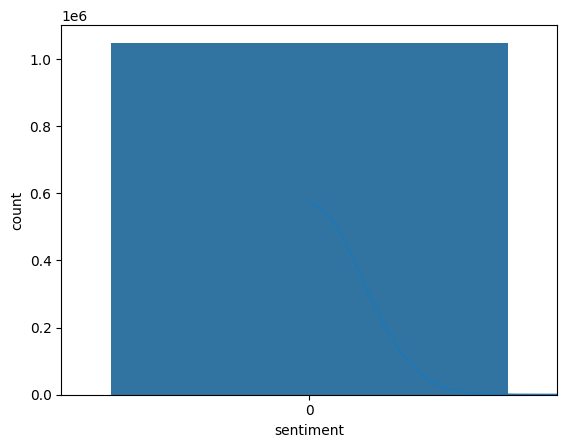

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.histplot(df['sentiment'],kde=True)
sns.countplot(df['sentiment'])

In [10]:
df=df.drop(columns=['query'])

In [11]:
texts = df['text']
text_lens = [len(t.split()) for t in texts.values]
#lengths of texts been taken and the mean of the lengths being carries out in the next steph
len_mean = np.mean(text_lens)
len_mean


13.404419534376276

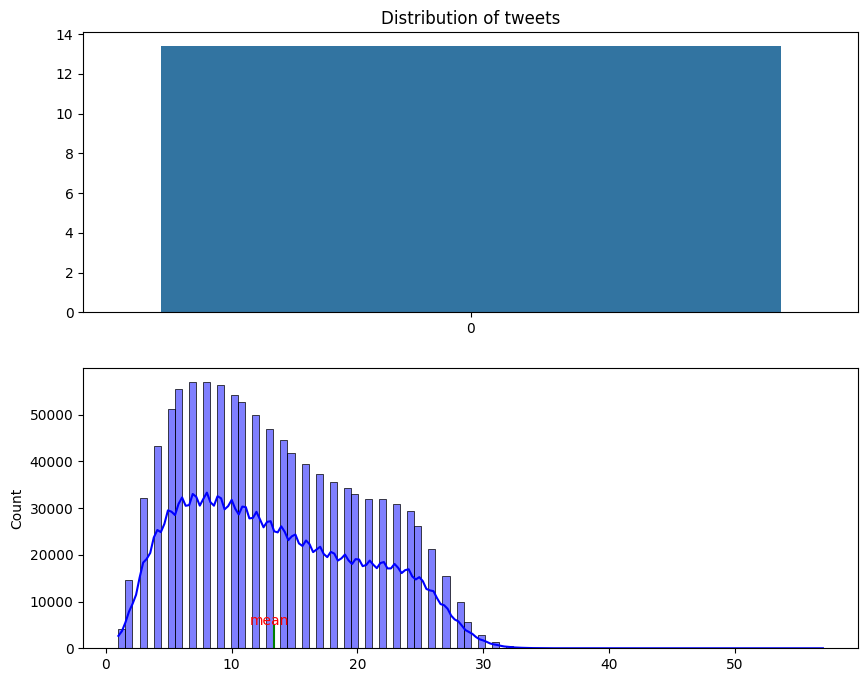

In [12]:
fig, axes = plt.subplots(2,1, figsize=(10, 8))
axes[0].set_title('Distribution of tweets')
sns.barplot(text_lens, ax=axes[0])
sns.histplot(text_lens,bins=100, kde=True, ax=axes[1],color='blue')
axes[1].vlines(len_mean, 0, 5000, color = 'g')
plt.annotate("mean", xy=(len_mean, 5000), xytext=(len_mean-2, 5050),color='r')
plt.show()

In [13]:
stuff_to_be_removed = list(stopwords.words('english'))+list(punctuation)
#reducing the word to it's original for is called stemming, eg: runs,running,ran all is stemmed to 'run'
stemmer = LancasterStemmer()
corpus = df['text'].tolist()
print(len(corpus))
print(corpus[0])

1048572
is upset that he can't update his Facebook by texting it... and might cry as a result  School today also. Blah!


In [14]:
final_corpus = []
final_corpus_joined = []
for i in df.index:
    text = re.sub('[^a-zA-Z]', ' ', df['text'][i])
    text = text.lower()
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    text=re.sub("(\\d|\\W)+"," ",text)
    text = text.split()
    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text  if not word in stuff_to_be_removed] 
    text1 = " ".join(text)
    final_corpus.append(text)
    final_corpus_joined.append(text1)

In [15]:
data_cleaned = pd.DataFrame()
data_cleaned["text"] = final_corpus_joined
data_cleaned["sentiment"] = df["sentiment"].values
data_eda = pd.DataFrame()
data_eda['text'] = final_corpus
data_eda['sentiment'] = df['sentiment'].values
data_eda.head()

,text,sentiment
0,"[upset, update, facebook, texting, might, cry,...",0
1,"[kenichan, dived, many, time, ball, managed, s...",0
2,"[whole, body, feel, itchy, like, fire]",0
3,"[nationwideclass, behaving, mad, see]",0
4,"[kwesidei, whole, crew]",0


In [16]:
positive = data_eda[data_eda['sentiment'] == 4]
positive_list = positive['text'].tolist()
negative = data_eda[data_eda['sentiment'] == 0]
negative_list = negative['text'].tolist()

In [17]:
positive_all = " ".join([word for sent in positive_list for word in sent ])
negative_all = " ".join([word for sent in negative_list for word in sent ])
print(positive_all)

love health uandpets u guy r best im meeting one besties tonight cant wait girl talk darealsunisakim thanks twitter add sunisa got meet hin show dc area sweetheart sick really cheap hurt much eat real food plus friend make soup lovesbrooklyn effect everyone productoffear tell burst laughing really loud thanks making come sulk r keith hill thans response ihad already find answer keepinupwkris jealous hope great time vega like acm love show tommcfly ah congrats mr fletcher finally joining twitter e voip responded stupid cat helping type forgive error crazy day school hour straiiight watch hill spencerpratt told ha happy birthday jb naughtyhaughty forget two half men love show nileyjileyluver haha worry get hang soundwav least one feeling lost may cause many later usual night already addicting lutheranlucciol make sure dm post link video lt lol gt miss better get permission blessing first added tweetie new iphone michellardi really know think globe yeah sana gumaling na ko para alam ko na

In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
xt = tfidf.fit_transform(data_cleaned['text'])
y = data_cleaned['sentiment']

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(xt, 
                                                    y, 
                                                    test_size=0.33, 
                                                    random_state=42,
                                                    stratify = y)


In [21]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train,y_train)


LogisticRegression()

In [22]:
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)
accuracy_score(y_train,y_train_pred)*100

85.6407365812484